In [15]:
import json
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from Flickr30kEntities.flickr30k_entities_utils import get_sentence_data

In [16]:
def read_json(filepath):
    res = {}
    with open(filepath, 'r') as f:
        for line in f:
            cur = json.loads(line)
            res[cur['caption_name']] = cur
    return res
def visualize(result_dict, caption_name):
    image_folder="Flickr30kEntities/flickr30k-images/"
    print('caption_name:', result_dict[caption_name]['caption_name'])
    
    # 这一段可以得到5句target
    sentence_folder="Flickr30kEntities/Sentences/"
    target_5 = get_sentence_data(sentence_folder + caption_name + ".txt")
    for i, cur_dict in enumerate(target_5):
        print('target_' + str(i + 1) + ':', cur_dict['sentence'])
    
    # 这一段得到dataloader中对应的target
#     print('target:', result_dict[caption_name]['target'])
    
    print('pred:', result_dict[caption_name]['pred'])
    img = mpimg.imread(image_folder + caption_name + '.jpg')
    imgplot = plt.imshow(img)
    plt.show()

In [17]:
# result_dict is a dict: {caption_name:{pred:str, target: str, caption_name:str, sentid: str}}
# 读取v2 infer之后生成的json文件
result_dict = read_json('v2/generated_sent.json')
img_id_list = list(result_dict)

caption_name: 1007129816
target_1: The man with pierced ears is wearing glasses and an orange hat .
target_2: A man with glasses is wearing a beer can crocheted hat .
target_3: A man with gauges and glasses is wearing a Blitz hat .
target_4: A man in an orange hat starring at something .
target_5: A man wears an orange hat and glasses .
pred: a man in a black shirt and a woman in a black shirt are standing in front of a large crowd


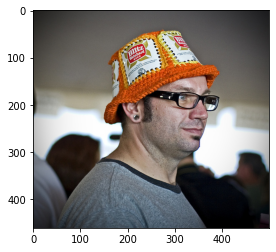

caption_name: 1009434119
target_1: A black and white dog is running in a grassy garden surrounded by a white fence .
target_2: A Boston Terrier is running on lush green grass in front of a white fence .
target_3: A black and white dog is running through the grass .
target_4: A dog runs on the green grass near a wooden fence .
target_5: A Boston terrier is running in the grass .
pred: a dog is running through the grass


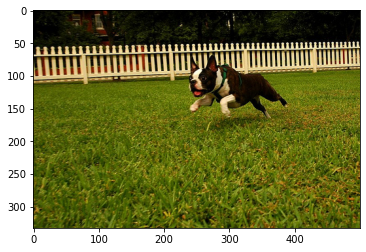

caption_name: 101362133
target_1: A young female student performing a downward kick to break a board held by her Karate instructor .
target_2: Girl about to kick a piece of wood in half while karate instructor holds it
target_3: A girl kicking a stick that a man is holding in tae kwon do class .
target_4: A girl in karate uniform breaking a stick with a front kick .
target_5: A girl breaking boards by using karate .
pred: a man in a white shirt and blue shorts is playing tennis


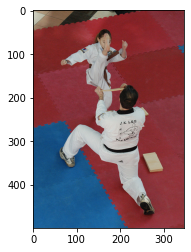

caption_name: 102617084
target_1: Five snowmobile riders all wearing helmets and goggles line up in a snowy clearing in a forest in front of their snowmobiles ; they are all wearing black snow pants and from left to right they are wearing a black coat , white coat , red coat , blue coat , and black coat .
target_2: Five people wearing winter jackets and helmets stand in the snow , with snowmobiles in the background .
target_3: Five people wearing winter clothing , helmets , and ski goggles stand outside in the snow .
target_4: A group of snowmobile riders gather in the snow .
target_5: Group gathered to go snowmobiling .
pred: a man in a red shirt and blue pants is riding a bike in a field


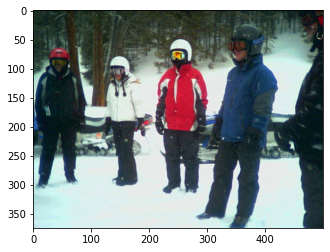

caption_name: 10287332
target_1: Two men sitting on the roof of a house while another one stands on a ladder .
target_2: Two men on a rooftop while another man stands atop a ladder watching them
target_3: Three men , one on a ladder , work on a roof .
target_4: People are fixing the roof of a house .
target_5: Three men are working on a roof .
pred: a man in a blue shirt and blue jeans is riding a skateboard on a skateboard


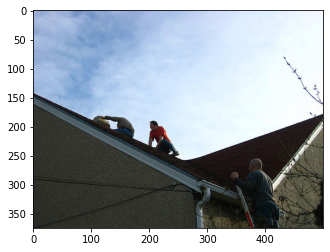

caption_name: 1039637574
target_1: A bride in a light pink dress poses for a picture with male relatives and is being photographed by a man in a cream shirt with white pants .
target_2: A man in light colored clothing photographs a group of men wearing dark suits and hats standing around a woman dressed in a strapless gown .
target_3: A photographer takes a picture of a group of one girl in a pink dress and 10 boys in suits and hats .
target_4: A man photographs a woman in a pink dress and a throng of men in suits .
target_5: Man taking a photograph of a well dressed group of teens .
pred: a group of people are walking down a street


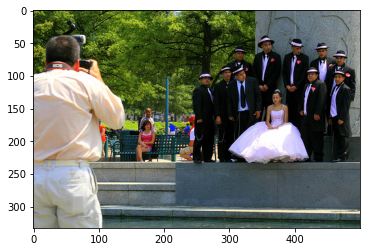

caption_name: 1043819504
target_1: A group of 11 people in winter wear such as beanies , skiing jackets , gloves and backpacks are standing in snow paddles outside a house made of ice blocks while a person in front of the door seems to be leading them .
target_2: A group of people wearing snowshoes , and dressed for winter hiking , is standing in front of a building that looks like it 's made of blocks of ice .
target_3: The people are quietly listening while the story of the ice cabin was explained to them .
target_4: A group of people standing in front of an igloo .
target_5: Several students waiting outside an igloo .
pred: a group of people are walking down a dirt road


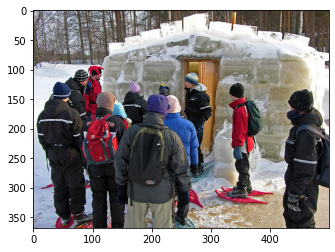

caption_name: 1043910339
target_1: A baseball player in red leaps into the air to avoid a player in blue , who is shortly behind him as he catches the ball , while other blue team members look on in the background .
target_2: A boy in a red uniform is attempting to avoid getting out at home plate , while the catcher in the blue uniform is attempting to catch him .
target_3: A baseball player coming into home plate with knee held high and the catcher right in front of him waiting for the ball .
target_4: A baseball player attempting to score a run before the catcher tags the player out .
target_5: A baseball catcher trying to tag a base runner in a baseball game .
pred: a man in a red shirt and blue shorts is playing a sport


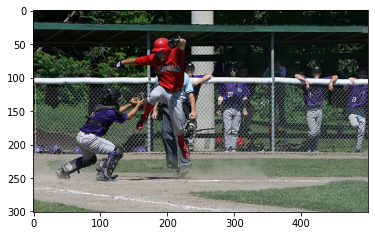

caption_name: 1044798682
target_1: A man wearing a hat and a white shirt is cleaning windows .
target_2: A man in a white shirt stands high up on scaffolding
target_3: A man stands on boards on top of a huge ladder .
target_4: Man works on top of scaffolding .
target_5: A guy works on a building .
pred: a man in a blue shirt is sitting on a bench


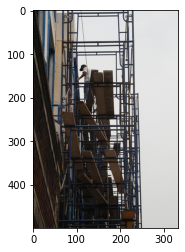

caption_name: 1071201387
target_1: A man wearing a reflective vest sits on the sidewalk and holds up pamphlets with bicycles on the cover .
target_2: Man in bright yellow vest displays bicycle safety information on street .
target_3: A man and woman talking are interrupted and a man covers his face .
target_4: A man in a vest is sitting in a chair and holding magazines .
target_5: A construction worker holds a sign about bicycling .
pred: a man in a blue shirt is sitting on a bench


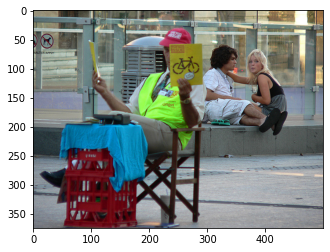

In [19]:
# give the caption_name/image_id, it will show the pred sents, target sents and corresponding img
for i in range(0, 10, 1):
    visualize(result_dict, img_id_list[i])

In [5]:
import json
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from Flickr30kEntities.flickr30k_entities_utils import get_sentence_data, get_annotations
import cv2

In [6]:
def read_entity_json(filepath):
    '''
    res: dict['caption_name']['entity_id'] = {'pred': List[], 'target': List[]}
    '''
    res = {}
    with open(filepath, 'r') as f:
        for line in f:
            cur = json.loads(line)
            caption_name = cur['caption_name']
            entity_id = cur['entityid']
            pred = cur['pred']
            target = [d['entity'] for d in cur['target']]
            if caption_name not in res:
                res[caption_name] = {}
            res[caption_name][entity_id] = {'pred': pred, 'target': target}
    return res

def visualize(result_dict, caption_name):
    image_folder="Flickr30kEntities/flickr30k-images/"
    anno_folder = "Flickr30kEntities/Annotations/"
    print('caption_name:', caption_name)
    annotations = get_annotations(anno_folder + caption_name+ ".xml")['boxes']
    
    for entity_id in result_dict[caption_name]:
        image=cv2.imread(image_folder + caption_name + '.jpg')
        output_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        for box in annotations[str(entity_id)]:
            cv2.rectangle(
                        output_image,
                        (box[0], box[1]),
                        (box[2], box[3]),
                        1, 2
            )
        print('pred result:', result_dict[caption_name][entity_id]['pred'])
        print('target_result', result_dict[caption_name][entity_id]['target'])
        plt.imshow(output_image)
        plt.show()
    
#     img = mpimg.imread(image_folder + caption_name + '.jpg')
#     imgplot = plt.imshow(img)
#     plt.show()

In [6]:
res = read_entity_json('v2/entity_generated_sent.json')
caption_names = list(res)

caption_name: 1141643526
pred result: ['a crowd of people']
target_result ['a single man', 'one man', 'a man']


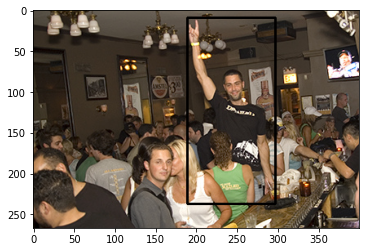

pred result: ['a man']
target_result ['a black tshirt', 'a black shirt']


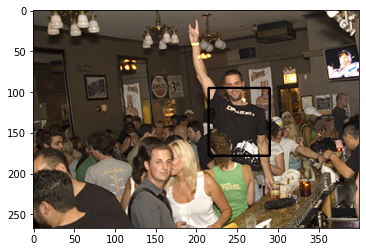

pred result: ['a cellphone']
target_result ['a rock gesture', 'UNK']


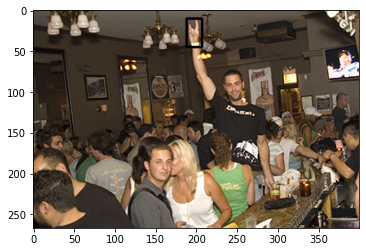

pred result: ['a cellphone']
target_result ['the rock']


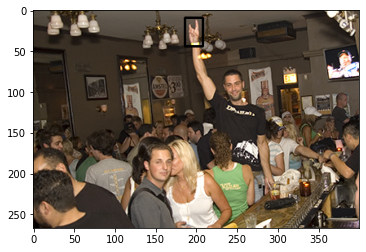

pred result: ['a cellphone']
target_result ['roll sign']


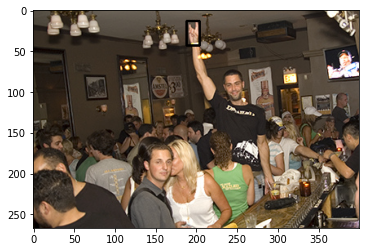

pred result: ['a meal']
target_result ['drinks']


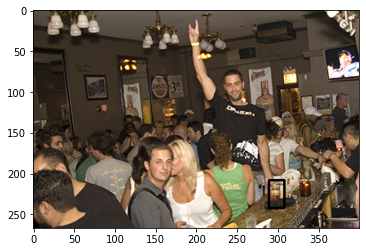

caption_name: 1141718391
pred result: ['a man']
target_result ['a woman', 'woman']


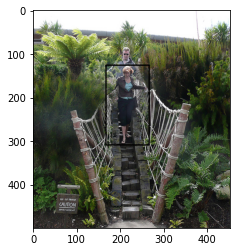

pred result: ['a woman']
target_result ['man', 'a man']


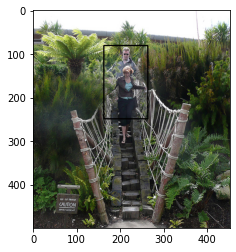

pred result: ['a bridge']
target_result ['a suspension bridge', 'wooden rope bridge', 'a rope bridge', 'a bridge']


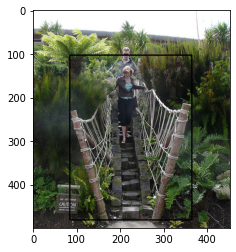

pred result: ['UNK']
target_result ['a caution sign']


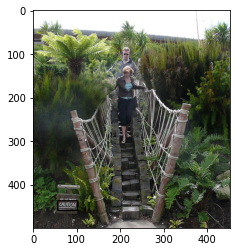

caption_name: 1150429218
pred result: ['a woman']
target_result ['an male entertainer', 'a man', 'a street juggler']


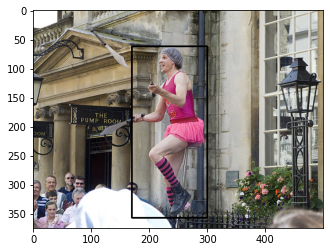

pred result: ['a cap']
target_result ['a hairnet', 'a gray cap']


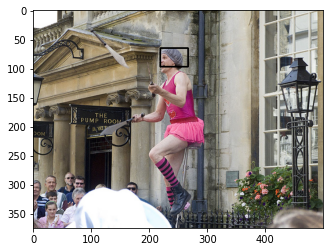

pred result: ['a pink shirt']
target_result ['UNK of a pink tank top', 'a pink tank top']


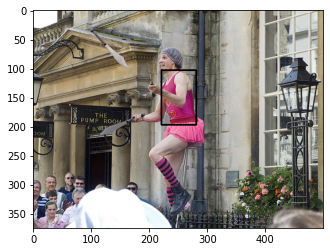

pred result: ['pink skirt']
target_result ['a skirt', 'skirt', 'a short pink skirt', 'short skirt']


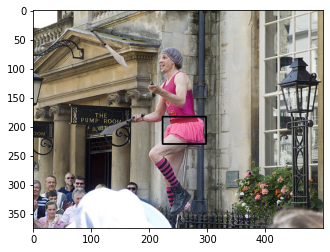

pred result: ['a woman']
target_result ['pink and black striped socks']


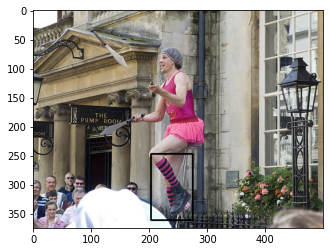

pred result: ['a backpack']
target_result ['boots']


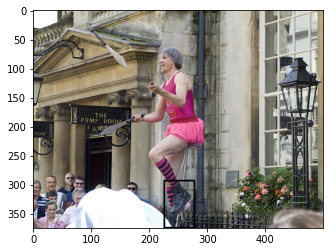

pred result: ['a large white tile']
target_result ['knives']


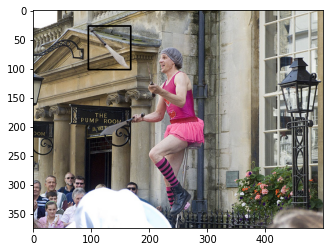

pred result: ['a building']
target_result ['a brick building']


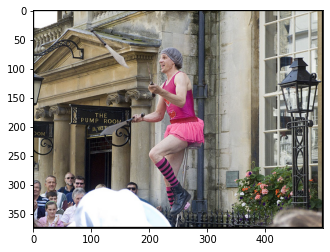

pred result: ['a building']
target_result ['whose sign']


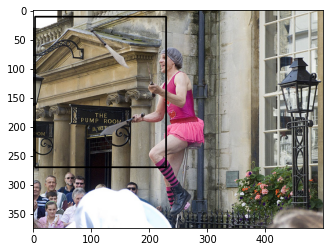

pred result: ['a sign']
target_result ['the pump room']


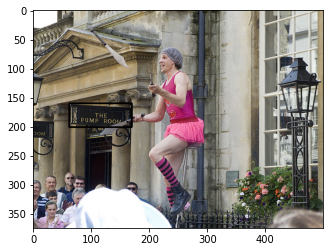

pred result: ['a pink skirt']
target_result ['knee high socks']


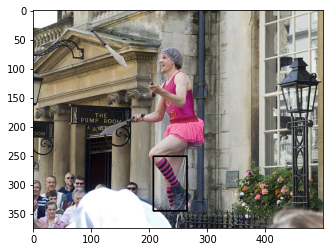

pred result: ['a black shirt']
target_result ['a unicycle']


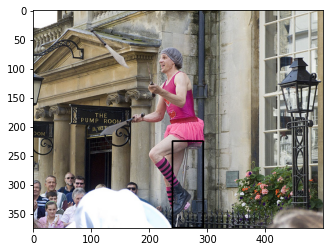

pred result: ['a woman']
target_result ['a colorful outfit']


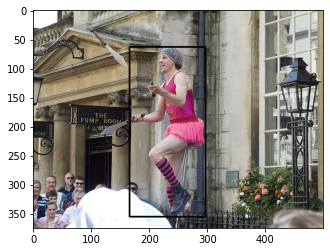

caption_name: 1155138244
pred result: ['a man']
target_result ['a girl', 'woman', 'an asian girl', 'the waitress']


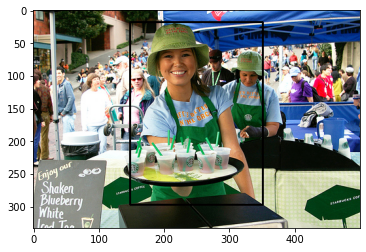

pred result: ['a blue hat']
target_result ['a green hat']


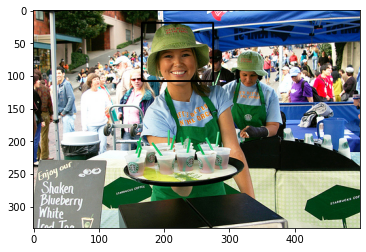

pred result: ['a table']
target_result ['apron']


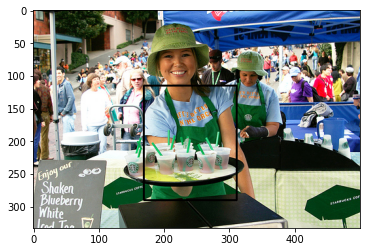

pred result: ['a table']
target_result ['drink samples', 'drinks', 'starbucks samples', 'UNK tea']


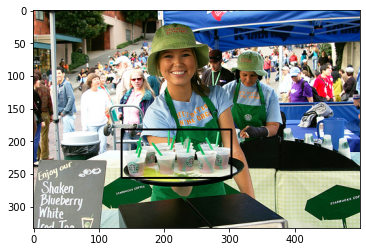

pred result: ['a man']
target_result ['a starbucks barista']


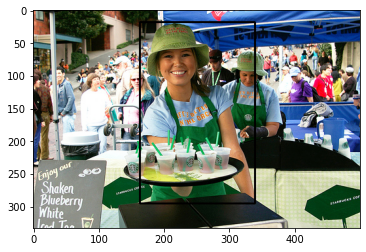

caption_name: 116569042
pred result: ['a man']
target_result ['two UNK men', 'two people', 'construction workers']


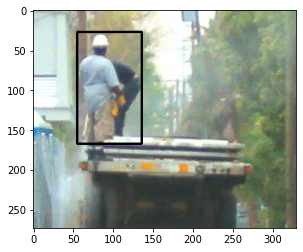

pred result: ['a bus']
target_result ['a piece of machinery']


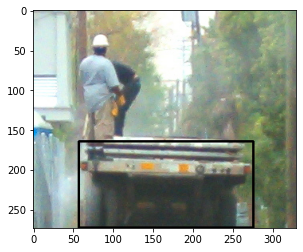

pred result: ['a metal bar']
target_result ['the bed of a truck', 'UNK truck', 'a truck']


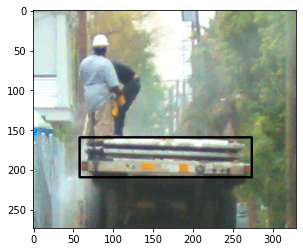

pred result: ['a net']
target_result ['picture of a man', 'a man']


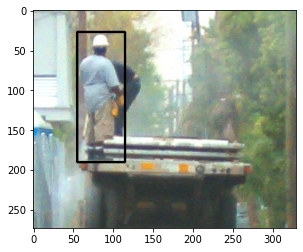

pred result: ['a white plastic bag']
target_result ['a blue shirt']


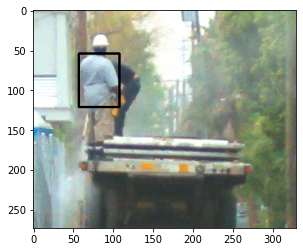

pred result: ['a white ball']
target_result ['a white hat', 'hard hat']


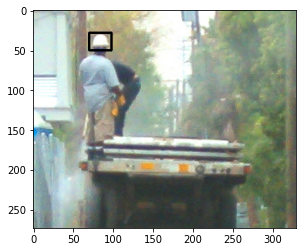

caption_name: 1206506157
pred result: ['a brown dog']
target_result ['two large brown dogs', 'two dogs', 'dogs']


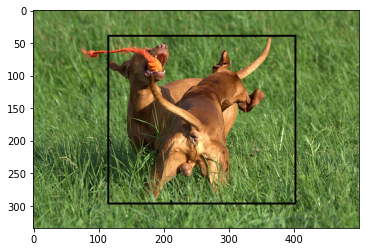

pred result: ['a toy']
target_result ['an orange toy', 'toy', 'orange toy']


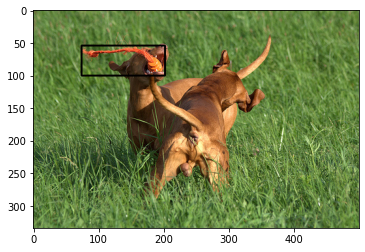

caption_name: 120764850
pred result: ['a baby']
target_result ['a baby', 'as a baby', 'a cute baby', 'baby']


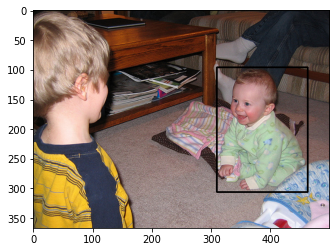

pred result: ['a young boy']
target_result ['toddler', 'a boy', 'another child', 'an older another child', 'an older sibling']


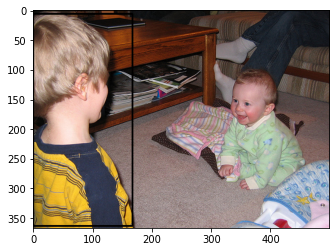

caption_name: 121556607
pred result: ['a man']
target_result ['a road']


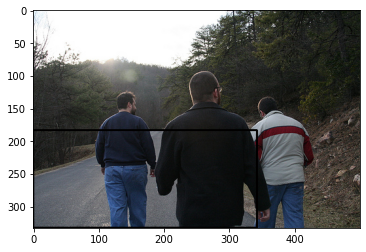

pred result: ['a dirt mound']
target_result ['the edges']


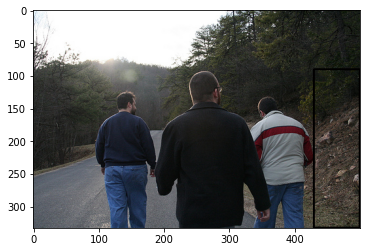

caption_name: 1215804065
pred result: ['a man']
target_result ['a person', 'someone']


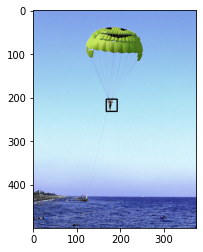

pred result: ['a green ball']
target_result ['a bright green parachute', 'a parachute', 'a green parachute']


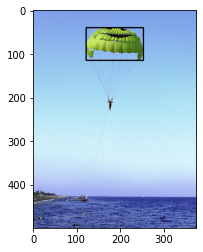

pred result: ['a green frisbee']
target_result ['a face']


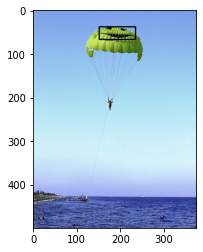

pred result: ['the ocean']
target_result ['a large body of water']


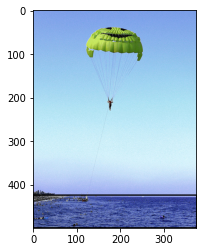

pred result: ['the water']
target_result ['a boat']


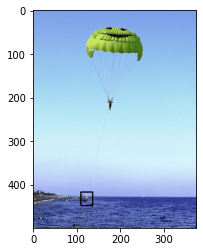

pred result: ['a man']
target_result ['a person']


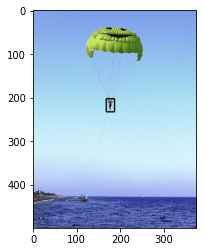

pred result: ['a boat']
target_result ['a beach']


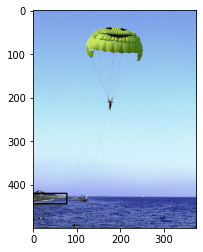

caption_name: 123244147
pred result: ['a construction site']
target_result ['a hill of dirt', 'a UNK site', 'all dirt', 'the side of the mountain', 'the dirt']


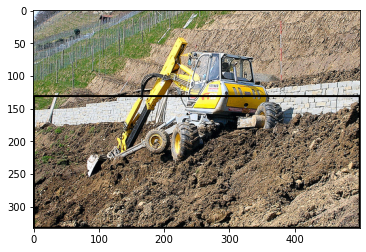

pred result: ['a yellow tractor']
target_result ['a bulldozer', 'a construction vehicle']


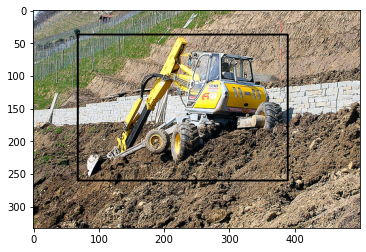

pred result: ['a yellow tractor']
target_result ['a tractor', 'a yellow tractor', 'this machine']


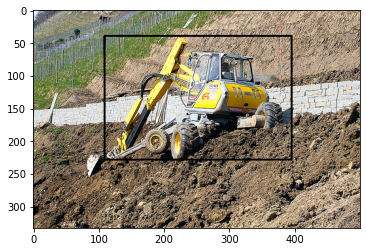

pred result: ['a yellow and yellow racing car']
target_result ['a retaining wall']


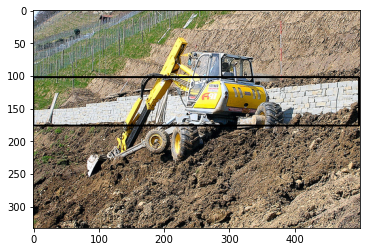

pred result: ['a tractor']
target_result ['a hillside']


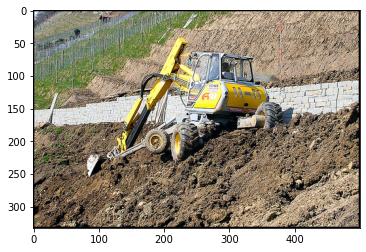

In [9]:
for i in range(20, 30):
    visualize(res, caption_names[i])

In [7]:
res1 = read_entity_json('v4_for_d/entity_generated_sent.json')
caption_names = list(res1)

caption_name: 1141643526
pred result: ['a crowd']
target_result ['a single man', 'one man', 'a man']


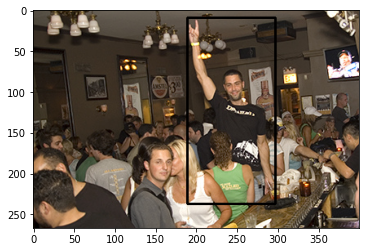

pred result: ['a man']
target_result ['a black tshirt', 'a black shirt']


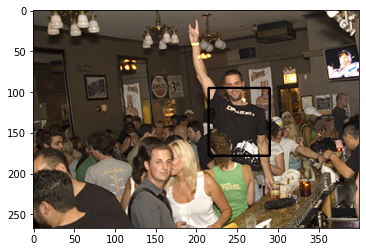

pred result: ['a hand']
target_result ['a rock gesture', 'UNK']


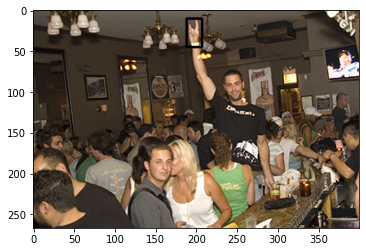

pred result: ['a microphone']
target_result ['the rock']


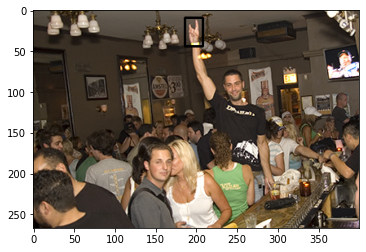

pred result: ['a microphone']
target_result ['roll sign']


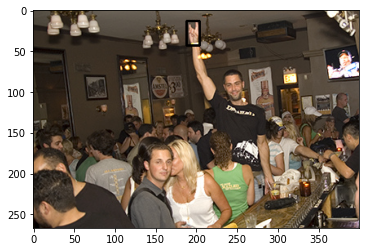

pred result: ['a drink']
target_result ['drinks']


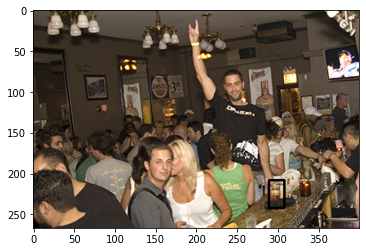

caption_name: 1141718391
pred result: ['a man']
target_result ['a woman', 'woman']


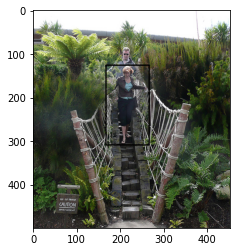

pred result: ['a woman']
target_result ['man', 'a man']


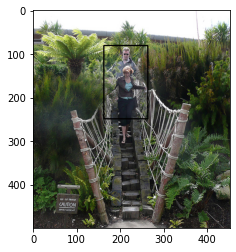

pred result: ['a large tree']
target_result ['a suspension bridge', 'wooden rope bridge', 'a rope bridge', 'a bridge']


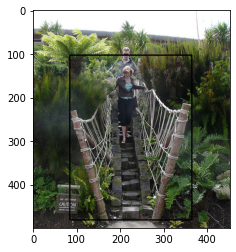

pred result: ['a UNK']
target_result ['a caution sign']


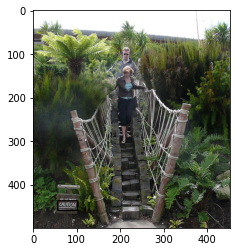

caption_name: 1150429218
pred result: ['a girl']
target_result ['an male entertainer', 'a man', 'a street juggler']


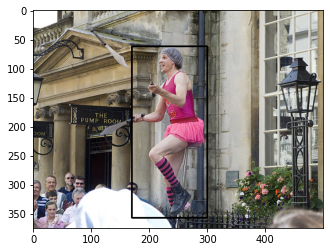

pred result: ['a black hat']
target_result ['a hairnet', 'a gray cap']


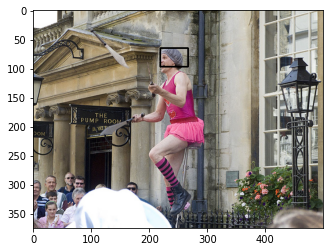

pred result: ['a pink shirt']
target_result ['UNK of a pink tank top', 'a pink tank top']


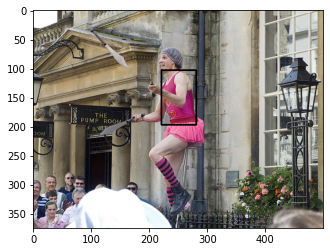

pred result: ['pink pants']
target_result ['a skirt', 'skirt', 'a short pink skirt', 'short skirt']


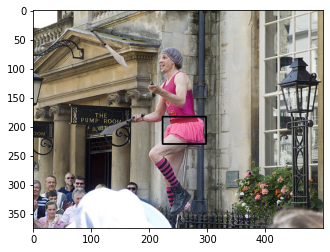

pred result: ['a red and black mat']
target_result ['pink and black striped socks']


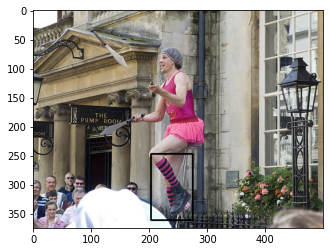

pred result: ['a red skirt']
target_result ['boots']


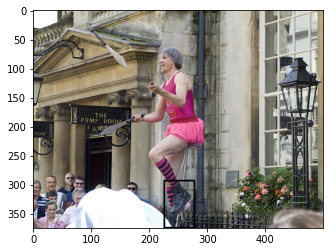

pred result: ['a brick wall']
target_result ['knives']


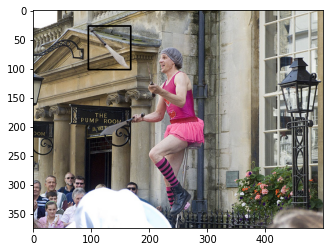

pred result: ['a building']
target_result ['a brick building']


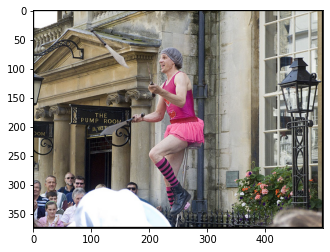

pred result: ['a building']
target_result ['whose sign']


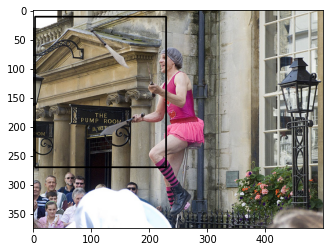

pred result: ['a sign']
target_result ['the pump room']


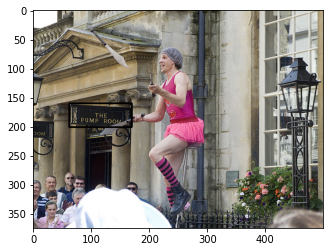

pred result: ['a red and black striped shirt']
target_result ['knee high socks']


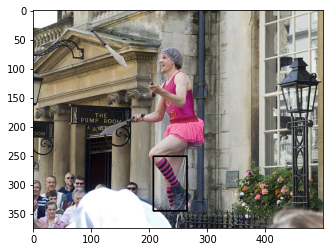

pred result: ['a blue dress']
target_result ['a unicycle']


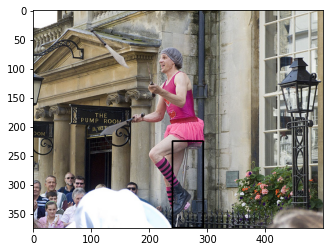

pred result: ['a woman']
target_result ['a colorful outfit']


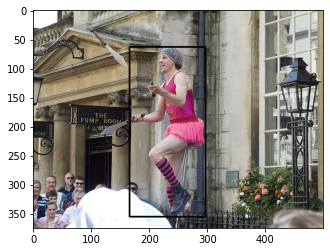

caption_name: 1155138244
pred result: ['a woman', 'a man']
target_result ['a girl', 'woman', 'an asian girl', 'the waitress']


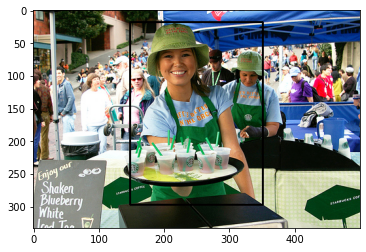

pred result: ['a blue hat']
target_result ['a green hat']


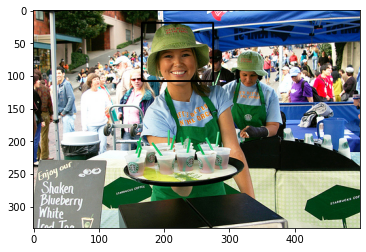

pred result: ['a blue apron']
target_result ['apron']


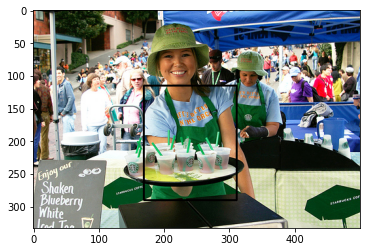

pred result: ['a drink']
target_result ['drink samples', 'drinks', 'starbucks samples', 'UNK tea']


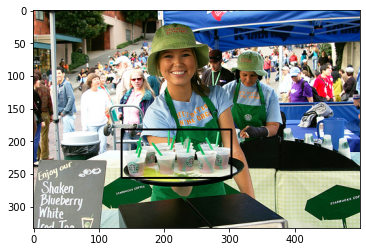

pred result: ['a woman']
target_result ['a starbucks barista']


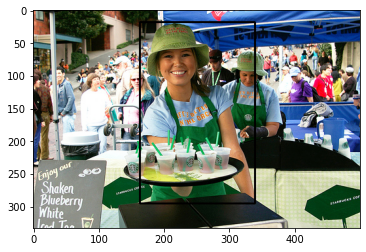

caption_name: 116569042
pred result: ['a man']
target_result ['two UNK men', 'two people', 'construction workers']


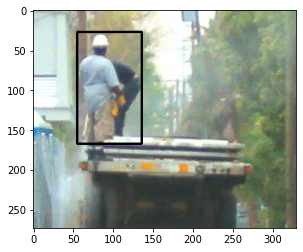

pred result: ['a grill']
target_result ['a piece of machinery']


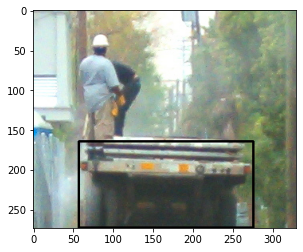

pred result: ['a sidewalk']
target_result ['the bed of a truck', 'UNK truck', 'a truck']


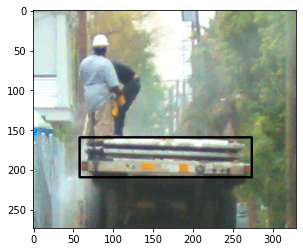

pred result: ['a man']
target_result ['picture of a man', 'a man']


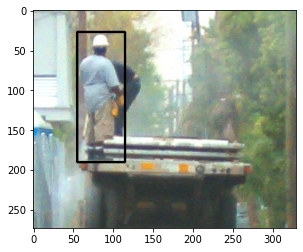

pred result: ['a white hard hat']
target_result ['a blue shirt']


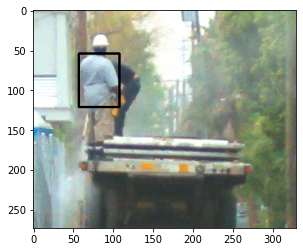

pred result: ['a blue hat']
target_result ['a white hat', 'hard hat']


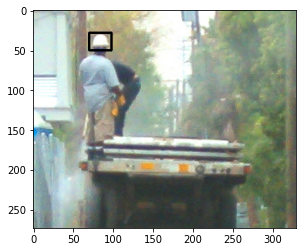

caption_name: 1206506157
pred result: ['a grassy field']
target_result ['two large brown dogs', 'two dogs', 'dogs']


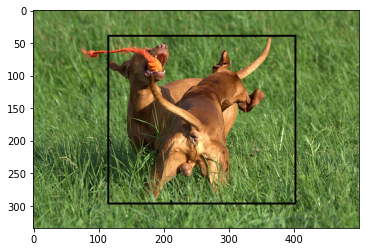

pred result: ['a toy', 'a red collar']
target_result ['an orange toy', 'toy', 'orange toy']


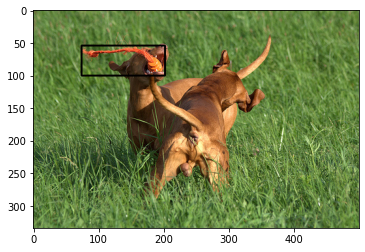

caption_name: 120764850
pred result: ['a baby']
target_result ['a baby', 'as a baby', 'a cute baby', 'baby']


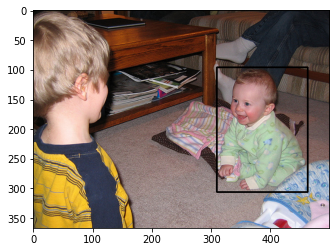

pred result: ['a baby']
target_result ['toddler', 'a boy', 'another child', 'an older another child', 'an older sibling']


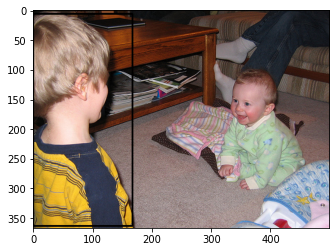

caption_name: 121556607
pred result: ['a man']
target_result ['a road']


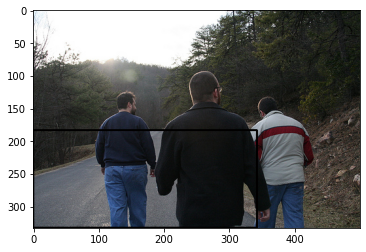

pred result: ['a rock']
target_result ['the edges']


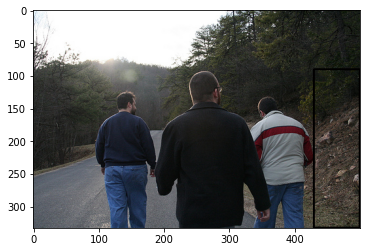

caption_name: 1215804065
pred result: ['a man']
target_result ['a person', 'someone']


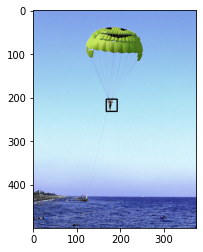

pred result: ['a yellow and white bird']
target_result ['a bright green parachute', 'a parachute', 'a green parachute']


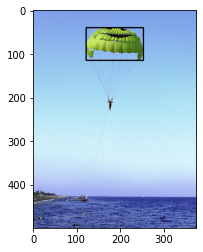

pred result: ['a yellow object']
target_result ['a face']


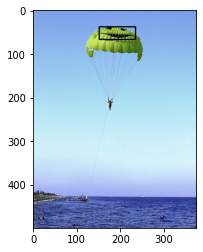

pred result: ['the ocean']
target_result ['a large body of water']


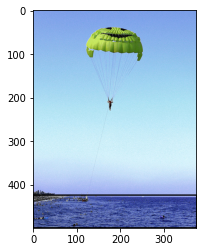

pred result: ['the water']
target_result ['a boat']


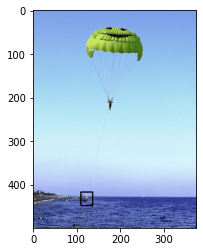

pred result: ['a man']
target_result ['a person']


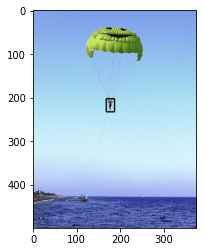

pred result: ['a man']
target_result ['a beach']


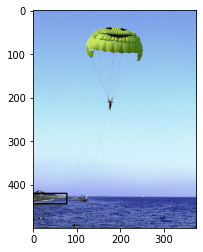

caption_name: 123244147
pred result: ['a dirt road']
target_result ['a hill of dirt', 'a UNK site', 'all dirt', 'the side of the mountain', 'the dirt']


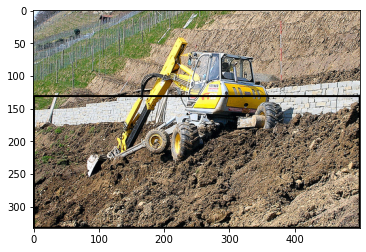

pred result: ['a tractor', 'a dirt track']
target_result ['a bulldozer', 'a construction vehicle']


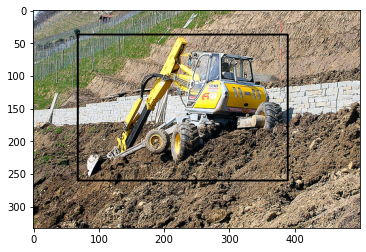

pred result: ['a dirt road', 'a tractor']
target_result ['a tractor', 'a yellow tractor', 'this machine']


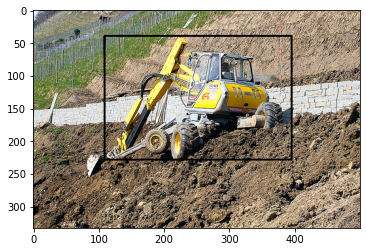

pred result: ['a construction site']
target_result ['a retaining wall']


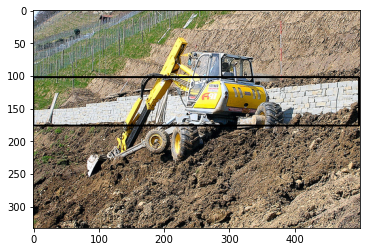

pred result: ['a dirt road']
target_result ['a hillside']


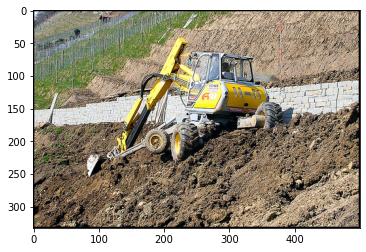

In [8]:
for i in range(20, 30):
    visualize(res1, caption_names[i])

In [3]:
res1 = read_entity_json('v3/entity_generated_sent.json')
caption_names = list(res1)